In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/medseg-covid-dataset-2/rp_lung_msk/rp_lung_msk/6.nii
/kaggle/input/medseg-covid-dataset-2/rp_lung_msk/rp_lung_msk/9.nii
/kaggle/input/medseg-covid-dataset-2/rp_lung_msk/rp_lung_msk/8.nii
/kaggle/input/medseg-covid-dataset-2/rp_lung_msk/rp_lung_msk/7.nii
/kaggle/input/medseg-covid-dataset-2/rp_lung_msk/rp_lung_msk/4.nii
/kaggle/input/medseg-covid-dataset-2/rp_lung_msk/rp_lung_msk/5.nii
/kaggle/input/medseg-covid-dataset-2/rp_lung_msk/rp_lung_msk/3.nii
/kaggle/input/medseg-covid-dataset-2/rp_lung_msk/rp_lung_msk/2.nii
/kaggle/input/medseg-covid-dataset-2/rp_lung_msk/rp_lung_msk/1.nii
/kaggle/input/medseg-covid-dataset-2/rp_msk/rp_msk/6.nii
/kaggle/input/medseg-covid-dataset-2/rp_msk/rp_msk/9.nii
/kaggle/input/medseg-covid-dataset-2/rp_msk/rp_msk/8.nii
/kaggle/input/medseg-covid-dataset-2/rp_msk/rp_msk/7.nii
/kaggle/input/medseg-covid-dataset-2/rp_msk/rp_msk/4.nii
/kaggle/input/medseg-covid-dataset-2/rp_msk/rp_msk/5.nii
/kaggle/input/medseg-covid-dataset-2/rp_msk/rp_msk/3.ni

In [3]:
import pandas as pd
import cv2
import numpy as np
import matplotlib.pyplot as plt
import nibabel as nib
from pylab import rcParams
import random
import glob
import os
import gc

# Data Pre-processing

In [4]:
def clahe_enhancer(test_img, demo):

  test_img = test_img*255
  test_img = np.uint8(test_img)
  test_img_flattened = test_img.flatten()
  
  clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
  clahe_image = clahe.apply(test_img)
  clahe_image_flattened = clahe_image.flatten()

  if demo == 1:

    fig = plt.figure()
    rcParams['figure.figsize'] = 10,10
    
    plt.subplot(2, 2, 1)
    plt.imshow(test_img, cmap='bone')
    plt.title("Original CT-Scan")

    plt.subplot(2, 2, 2)
    plt.hist(test_img_flattened)
    plt.title("Histogram of Original CT-Scan")

    plt.subplot(2, 2, 3)
    plt.imshow(clahe_image, cmap='bone')
    plt.title("CLAHE Enhanced CT-Scan")

    plt.subplot(2, 2, 4)
    plt.hist(clahe_image_flattened)
    plt.title("Histogram of CLAHE Enhanced CT-Scan")

  return(clahe_image)

In [5]:
def cropper(test_img, demo):

  test_img = test_img*255
  test_img = np.uint8(test_img)

  # ret, thresh = cv2.threshold(test_img, 50, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU) 
  # ret, thresh = cv2.threshold(test_img, ret, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU) 

  contours,hierarchy = cv2.findContours(test_img, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
  areas = [cv2.contourArea(c) for c in contours]

  x = np.argsort(areas)

  max_index = x[x.size - 1]
  cnt1=contours[max_index]
  second_max_index = x[x.size - 2]
  cnt2 = contours[second_max_index]

  # max_index = np.argmax(areas)
  # cnt=contours[max_index]

  x,y,w,h = cv2.boundingRect(cnt1)
  # print(x,y,w,h)
  p,q,r,s = cv2.boundingRect(cnt2)
  # print(p,q,r,s)

  cropped1 = test_img[y:y+h, x:x+w]
  cropped1 = cv2.resize(cropped1, dsize=(125,250), interpolation=cv2.INTER_AREA)
  cropped2 = test_img[q:q+s, p:p+r]
  cropped2 = cv2.resize(cropped2, dsize=(125,250), interpolation=cv2.INTER_AREA)

  fused = np.concatenate((cropped1, cropped2), axis=1)

  # super_cropped = test_img[y+7:y+h-20, x+25:x+w-25]
  points_lung1 = []
  points_lung2 = []
  
    
  points_lung1.append(x); points_lung1.append(y); points_lung1.append(w); points_lung1.append(h)
  points_lung2.append(p); points_lung2.append(q); points_lung2.append(r); points_lung2.append(s)

  # print(points_lung1)
  # print(points_lung2)
  
  if demo == 1:

    fig = plt.figure()
    rcParams['figure.figsize'] = 35, 35

    plt.subplot(1, 3, 1)
    plt.imshow(test_img, cmap='bone')
    plt.title("Original CT-Scan")

    # plt.subplot(1, 3, 2)
    # plt.imshow(thresh, cmap='bone')
    # plt.title("Binary Mask")

    plt.subplot(1, 3, 3)
    plt.imshow(fused, cmap='bone')
    plt.title("Cropped CT scan after making bounding rectangle")

    # plt.subplot(1, 4, 4)
    # plt.imshow(super_cropped, cmap='bone')
    # plt.title("Cropped further manually")

    plt.show()

  return(fused, points_lung1, points_lung2)

In [6]:
def read_nii_demo(filepath, data):
    ct_scan = nib.load(filepath)
    array   = ct_scan.get_fdata()
    array   = np.rot90(np.array(array))
    slices = array.shape[2]
    array = array[:,:,round(slices*0.2):round(slices*0.8)]
    array = np.reshape(np.rollaxis(array, 2),(array.shape[2],array.shape[0],array.shape[1], 1))

    for img_no in range(0, array.shape[0]):
        # array = Image.resize(array[...,img_no], (img_size,img_size))
        img = cv2.resize(array[img_no], dsize=(img_size, img_size), interpolation=cv2.INTER_AREA)
        xmax, xmin = img.max(), img.min()
        img = (img - xmin)/(xmax - xmin)
        data.append(img)

In [7]:
def read_nii(filepath, data, string):
    global all_points_of_lung1
    global all_points_of_lung2
    ct_scan = nib.load(filepath)
    array   = ct_scan.get_fdata()
    array   = np.rot90(np.array(array))
    slices = array.shape[2]
    array = array[:,:,round(slices*0.2):round(slices*0.8)]
    array = np.reshape(np.rollaxis(array, 2),(array.shape[2],array.shape[0],array.shape[1],1))
    #print(array.shape[2])
    #array = skimage.transform.resize(array, (array.shape[2], img_size, img_size))
    #array = cv2.resize(array, dsize=(img_size, img_size), interpolation=cv2.INTER_CUBIC)

    if string == "lungs":
      all_points_for_lung1 = []
      all_points_for_lung2 = []
        
    for img_no in range(0, array.shape[0]):
        if string == 'lungs' and np.unique(array[img_no]).size == 1:
          continue
        img = cv2.resize(array[img_no], dsize=(img_size, img_size), interpolation=cv2.INTER_AREA)
        xmax, xmin = img.max(), img.min()
        img = (img - xmin)/(xmax - xmin)

        if string == 'lungs':
          # img = np.uint8(img*255) 
          img[img>0]=1
          img, points1, points2 = cropper(img, demo = 0)
          all_points_of_lung1.append((points1[0], points1[1], points1[2], points1[3]))
          all_points_of_lung2.append((points2[0], points2[1], points2[2], points2[3]))
          continue 
            
        if string == "cts" and img_no < len(all_points_of_lung1):
          img = clahe_enhancer(img, demo = 0)
          # img, points1, points2 = cropper(img, demo = 0)
          # all_points_of_lung1.append((points1[0], points1[1], points1[2], points1[3]))
          # all_points_of_lung2.append((points2[0], points2[1], points2[2], points2[3]))   
          a,b,c,d = all_points_of_lung1[img_no]
          e,f,g,h = all_points_of_lung2[img_no]
          img1 = img[b:b+d, a:a+c]
          img1 = cv2.resize(img1, dsize=(125,250), interpolation=cv2.INTER_AREA)
          img2 = img[f:f+h, e:e+g]
          img2 = cv2.resize(img2, dsize=(125,250), interpolation=cv2.INTER_AREA)
          img = np.concatenate((img1, img2), axis=1)    

        if string == "infections" and img_no < len(all_points_of_lung1):
          a,b,c,d = all_points_of_lung1[img_no]
          e,f,g,h = all_points_of_lung2[img_no]
          img = np.uint8(img*255)
          img1 = img[b:b+d, a:a+c]
          img1 = cv2.resize(img1, dsize=(125,250), interpolation=cv2.INTER_AREA)
          img2 = img[f:f+h, e:e+g]
          img2 = cv2.resize(img2, dsize=(125,250), interpolation=cv2.INTER_AREA)
          img = np.concatenate((img1, img2), axis=1)


        # img = cv2.resize(img, dsize=(192, 192), interpolation=cv2.INTER_LINEAR)
        # img = img/255
        #  remember to normalize again
        # also resize images and masks for all
        
        data.append(img)

In [8]:
img_size = 512

In [9]:
all_points_of_lung1 = []
all_points_of_lung2 = []

## For COVID-19-CT-20 dataset

In [10]:
# Read and examine sarscov2-ctscan-dataset metadata
raw_data = pd.read_csv("/kaggle/input/covid19-ct-scans/metadata.csv")
raw_data.head()

,ct_scan,lung_mask,infection_mask,lung_and_infection_mask
0,../input/covid19-ct-scans/ct_scans/coronacases...,../input/covid19-ct-scans/lung_mask/coronacase...,../input/covid19-ct-scans/infection_mask/coron...,../input/covid19-ct-scans/lung_and_infection_m...
1,../input/covid19-ct-scans/ct_scans/coronacases...,../input/covid19-ct-scans/lung_mask/coronacase...,../input/covid19-ct-scans/infection_mask/coron...,../input/covid19-ct-scans/lung_and_infection_m...
2,../input/covid19-ct-scans/ct_scans/coronacases...,../input/covid19-ct-scans/lung_mask/coronacase...,../input/covid19-ct-scans/infection_mask/coron...,../input/covid19-ct-scans/lung_and_infection_m...
3,../input/covid19-ct-scans/ct_scans/coronacases...,../input/covid19-ct-scans/lung_mask/coronacase...,../input/covid19-ct-scans/infection_mask/coron...,../input/covid19-ct-scans/lung_and_infection_m...
4,../input/covid19-ct-scans/ct_scans/coronacases...,../input/covid19-ct-scans/lung_mask/coronacase...,../input/covid19-ct-scans/infection_mask/coron...,../input/covid19-ct-scans/lung_and_infection_m...


In [11]:
raw_data.shape

(20, 4)

In [12]:
cts_1 = []
lungs_1 = []
infections_1 = []

In [13]:
for i in range(0, 20):
    read_nii(raw_data.loc[i,'lung_mask'], lungs_1, 'lungs')
    read_nii(raw_data.loc[i,'ct_scan'], cts_1, 'cts') 
    read_nii(raw_data.loc[i,'infection_mask'], infections_1, 'infections')

/tmp/ipykernel_36/1539260012.py:23: RuntimeWarning: invalid value encountered in divide
  img = (img - xmin)/(xmax - xmin)
/tmp/ipykernel_36/1539260012.py:49: RuntimeWarning: invalid value encountered in cast
  img = np.uint8(img*255)


(250, 250) (250, 250)


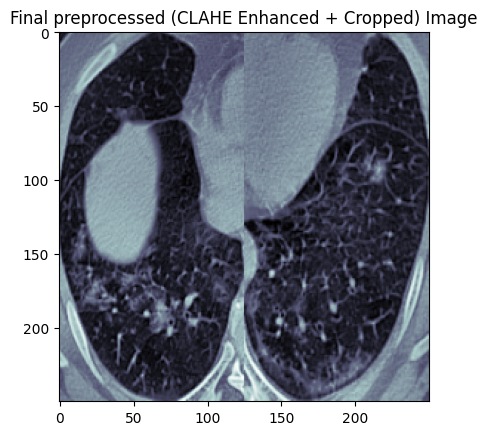

In [14]:
x= 50
plt.imshow(cts_1[x], cmap='bone')
plt.title("Final preprocessed (CLAHE Enhanced + Cropped) Image")
rcParams['figure.figsize'] = 7, 7
print(infections_1[x].shape, cts_1[x].shape)

In [15]:
y_label_1 = []
for i in range(0, len(infections_1)):
  if len(np.unique(infections_1[i]))!=1:
    y_label_1.append(1)
  else:
    y_label_1.append(0)

In [16]:
print(f"Non-Covid-19 cases from dataset1: {y_label_1.count(0)}")
print(f"Covid-19 cases from dataset1: {y_label_1.count(1)}")

Non-Covid-19 cases from dataset1: 691
Covid-19 cases from dataset1: 1421


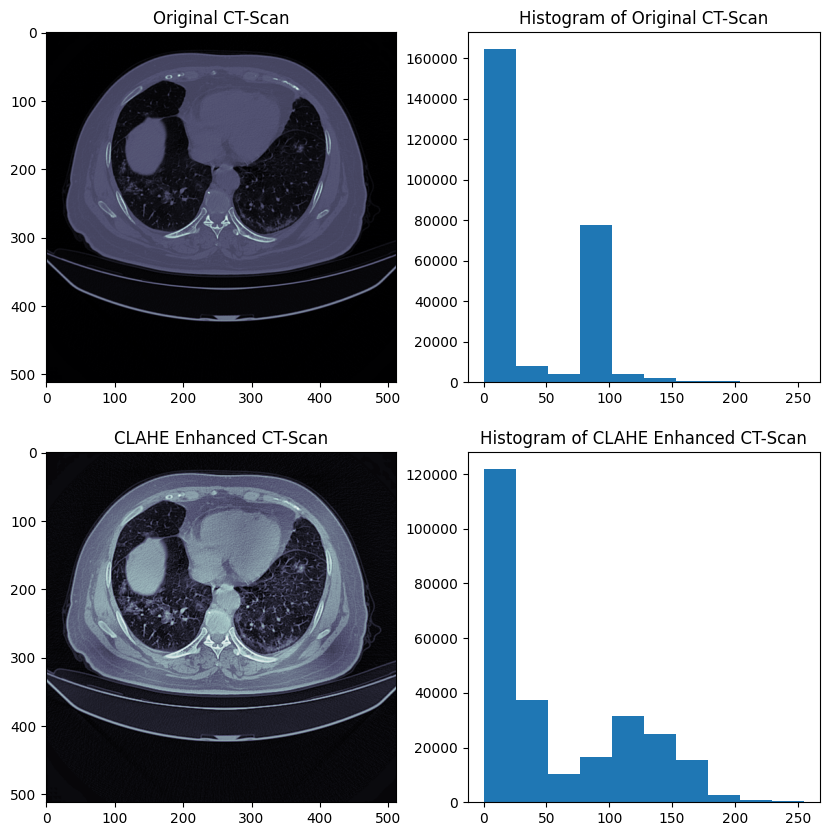

In [17]:
test_file = []
read_nii_demo(raw_data.loc[0,'ct_scan'], test_file)
test_file = np.array(test_file)
rcParams['figure.figsize'] = 10, 10
clahe_image = clahe_enhancer(test_file[50], demo = 1)

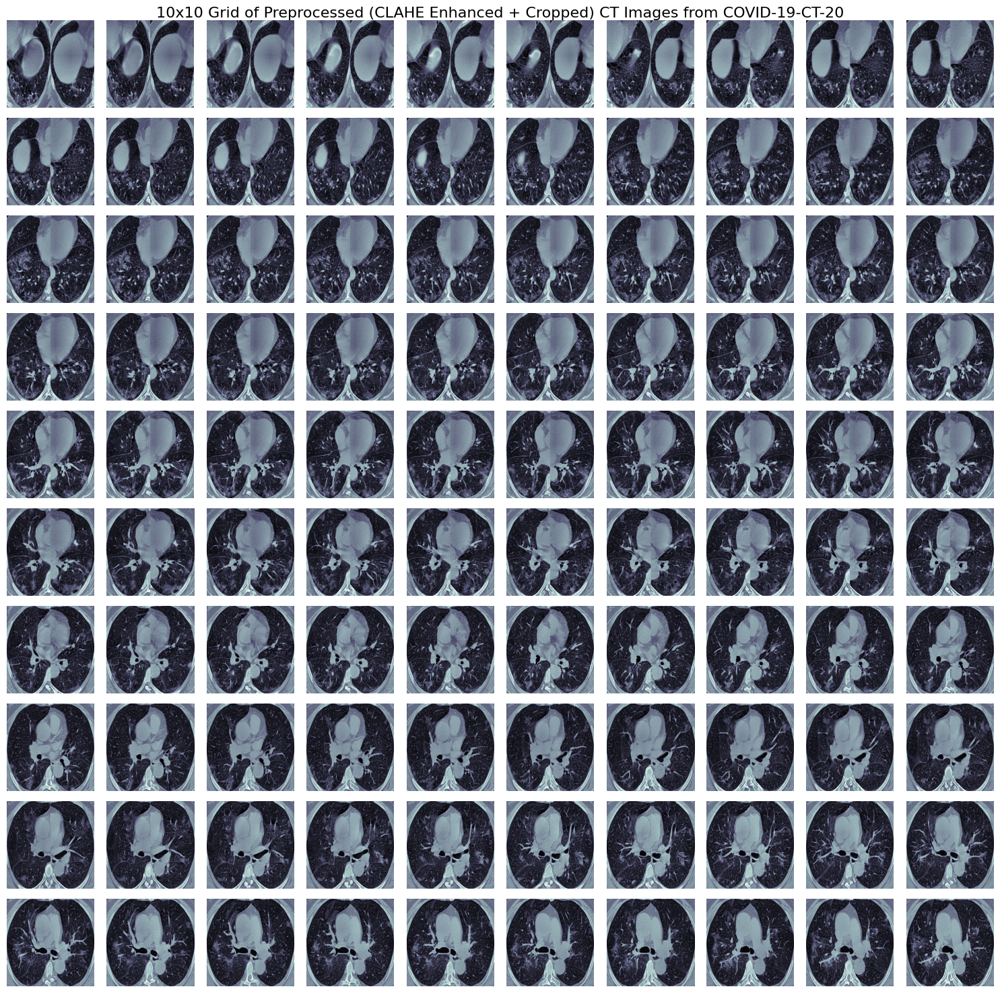

In [18]:
fig, axes = plt.subplots(10, 10, figsize=(15, 15))

for i, ax in enumerate(axes.flat):
    if i < len(cts_1):
        ax.imshow(cts_1[i+40], cmap='bone')
        ax.axis('off')
    else:
        ax.axis('off')

plt.suptitle("10x10 Grid of Preprocessed (CLAHE Enhanced + Cropped) CT Images from COVID-19-CT-20", fontsize=16)
plt.tight_layout()
plt.show()

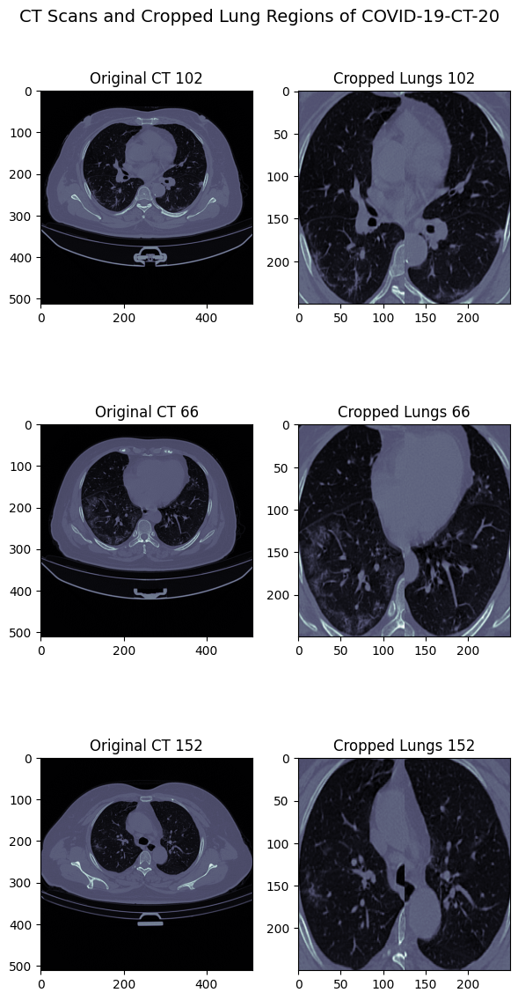

In [19]:
lung_mask_file = []
ct_scan_file = []

read_nii_demo(raw_data.loc[0,'lung_mask'], lung_mask_file)
read_nii_demo(raw_data.loc[0,'ct_scan'], ct_scan_file)

indices = random.sample(range(len(ct_scan_file)), 3)

fig, axes = plt.subplots(3, 2, figsize=(6, 12))
fig.suptitle("CT Scans and Cropped Lung Regions of COVID-19-CT-20", fontsize=14)
for i, idx in enumerate(indices):
    lung_mask = lung_mask_file[idx]
    ct_scan = ct_scan_file[idx]

    lung_mask[lung_mask > 0] = 1
    _, lung1_points, lung2_points = cropper(lung_mask, demo=0)

    a,b,c,d = lung1_points
    e,f,g,h = lung2_points

    img1 = ct_scan[b:b+d, a:a+c]
    img1 = cv2.resize(img1, dsize=(125,250), interpolation=cv2.INTER_AREA)
    img2 = ct_scan[f:f+h, e:e+g]
    img2 = cv2.resize(img2, dsize=(125,250), interpolation=cv2.INTER_AREA)
    cropped = np.concatenate((img1, img2), axis=1)  

    axes[i,0].imshow(ct_scan, cmap='bone')
    axes[i,0].set_title(f"Original CT {idx}")

    axes[i,1].imshow(cropped, cmap='bone')
    axes[i,1].set_title(f"Cropped Lungs {idx}")

plt.tight_layout()
plt.show()


In [20]:
print(len(cts_1) , len(infections_1))

2112 2112


## For COVID-19 CT segmentation dataset

In [21]:
all_points_of_lung1 = []
all_points_of_lung2 = []

In [22]:
cts_2 = []
lungs_2 = []
infections_2 = []

In [23]:
lung_mask_paths = sorted(glob.glob("/kaggle/input/medseg-covid-dataset-2/rp_lung_msk/rp_lung_msk/*.nii"),
                         key=lambda x: int(os.path.basename(x).split('.')[0]))
infection_mask_paths = sorted(glob.glob("/kaggle/input/medseg-covid-dataset-2/rp_msk/rp_msk/*.nii"),
                              key=lambda x: int(os.path.basename(x).split('.')[0]))
ct_scan_paths = sorted(glob.glob("/kaggle/input/medseg-covid-dataset-2/rp_im/rp_im/*.nii"),
                       key=lambda x: int(os.path.basename(x).split('.')[0]))

print(len(lung_mask_paths), len(infection_mask_paths), len(ct_scan_paths))

9 9 9


In [24]:
for i, (lung_path, inf_path, ct_path) in enumerate(zip(lung_mask_paths, infection_mask_paths, ct_scan_paths)):
    print(f"Sample {i}:")
    print(" Lung:", lung_path)
    print(" Infection:", inf_path)
    print(" CT:", ct_path)
    
    read_nii(lung_path, lungs_2, 'lungs')
    read_nii(ct_path, cts_2, 'cts')
    read_nii(inf_path, infections_2, 'infections')

Sample 0:
 Lung: /kaggle/input/medseg-covid-dataset-2/rp_lung_msk/rp_lung_msk/1.nii
 Infection: /kaggle/input/medseg-covid-dataset-2/rp_msk/rp_msk/1.nii
 CT: /kaggle/input/medseg-covid-dataset-2/rp_im/rp_im/1.nii
Sample 1:
 Lung: /kaggle/input/medseg-covid-dataset-2/rp_lung_msk/rp_lung_msk/2.nii
 Infection: /kaggle/input/medseg-covid-dataset-2/rp_msk/rp_msk/2.nii
 CT: /kaggle/input/medseg-covid-dataset-2/rp_im/rp_im/2.nii


/tmp/ipykernel_36/1539260012.py:23: RuntimeWarning: invalid value encountered in divide
  img = (img - xmin)/(xmax - xmin)
/tmp/ipykernel_36/1539260012.py:49: RuntimeWarning: invalid value encountered in cast
  img = np.uint8(img*255)


Sample 2:
 Lung: /kaggle/input/medseg-covid-dataset-2/rp_lung_msk/rp_lung_msk/3.nii
 Infection: /kaggle/input/medseg-covid-dataset-2/rp_msk/rp_msk/3.nii
 CT: /kaggle/input/medseg-covid-dataset-2/rp_im/rp_im/3.nii
Sample 3:
 Lung: /kaggle/input/medseg-covid-dataset-2/rp_lung_msk/rp_lung_msk/4.nii
 Infection: /kaggle/input/medseg-covid-dataset-2/rp_msk/rp_msk/4.nii
 CT: /kaggle/input/medseg-covid-dataset-2/rp_im/rp_im/4.nii
Sample 4:
 Lung: /kaggle/input/medseg-covid-dataset-2/rp_lung_msk/rp_lung_msk/5.nii
 Infection: /kaggle/input/medseg-covid-dataset-2/rp_msk/rp_msk/5.nii
 CT: /kaggle/input/medseg-covid-dataset-2/rp_im/rp_im/5.nii
Sample 5:
 Lung: /kaggle/input/medseg-covid-dataset-2/rp_lung_msk/rp_lung_msk/6.nii
 Infection: /kaggle/input/medseg-covid-dataset-2/rp_msk/rp_msk/6.nii
 CT: /kaggle/input/medseg-covid-dataset-2/rp_im/rp_im/6.nii
Sample 6:
 Lung: /kaggle/input/medseg-covid-dataset-2/rp_lung_msk/rp_lung_msk/7.nii
 Infection: /kaggle/input/medseg-covid-dataset-2/rp_msk/rp_msk/7

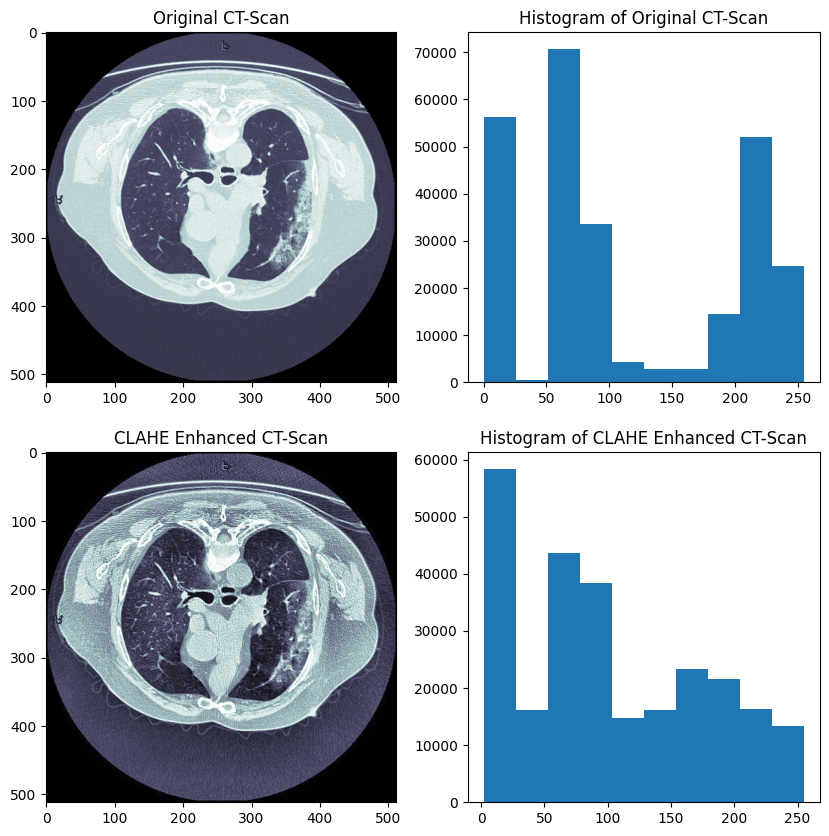

In [25]:
test_file = []
read_nii_demo("/kaggle/input/medseg-covid-dataset-2/rp_im/rp_im/1.nii", test_file)
test_file = np.array(test_file)
rcParams['figure.figsize'] = 10, 10
clahe_image = clahe_enhancer(test_file[8], demo = 1)

(250, 250) (250, 250)


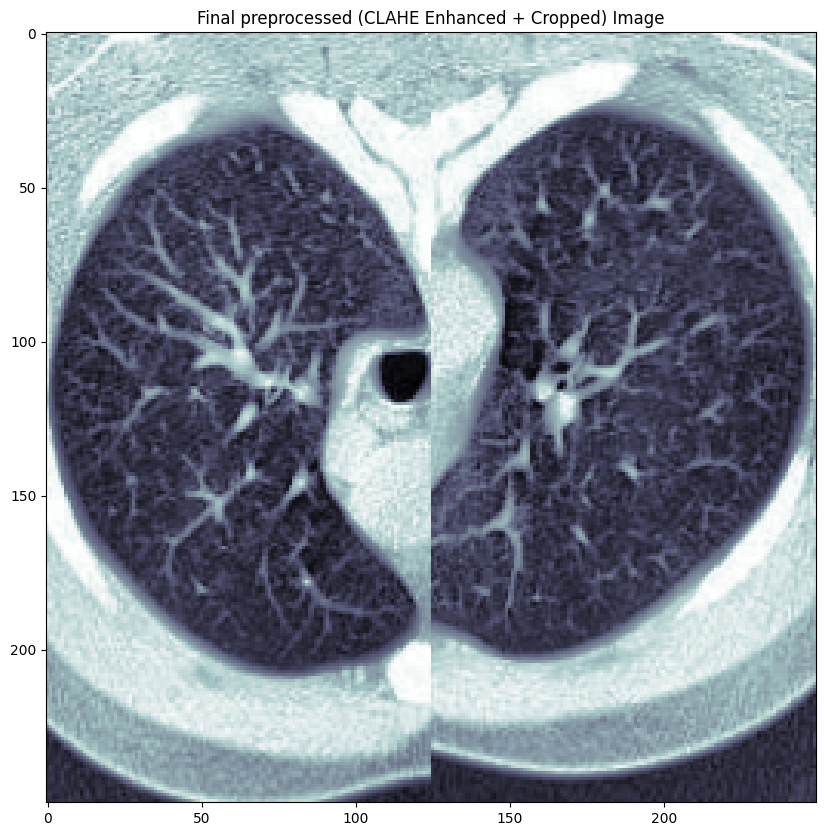

In [26]:
x= 45
plt.imshow(cts_2[x], cmap='bone')
plt.title("Final preprocessed (CLAHE Enhanced + Cropped) Image")
rcParams['figure.figsize'] = 7, 7
print(infections_2[x].shape, cts_2[x].shape)

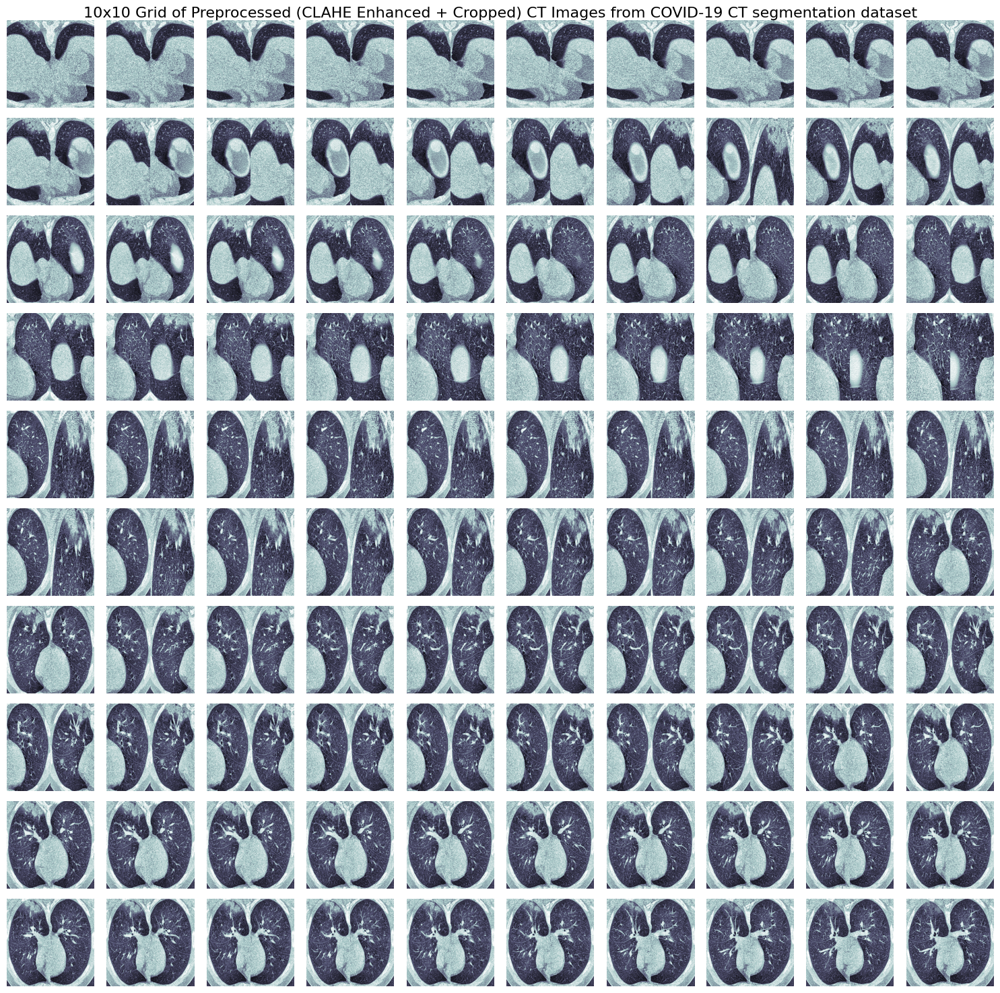

In [27]:
fig, axes = plt.subplots(10, 10, figsize=(15, 15))

for i, ax in enumerate(axes.flat):
    if i < len(cts_2):
        ax.imshow(cts_2[i+60], cmap='bone')
        ax.axis('off')
    else:
        ax.axis('off')

plt.suptitle("10x10 Grid of Preprocessed (CLAHE Enhanced + Cropped) CT Images from COVID-19 CT segmentation dataset", fontsize=16)
plt.tight_layout()
plt.show()

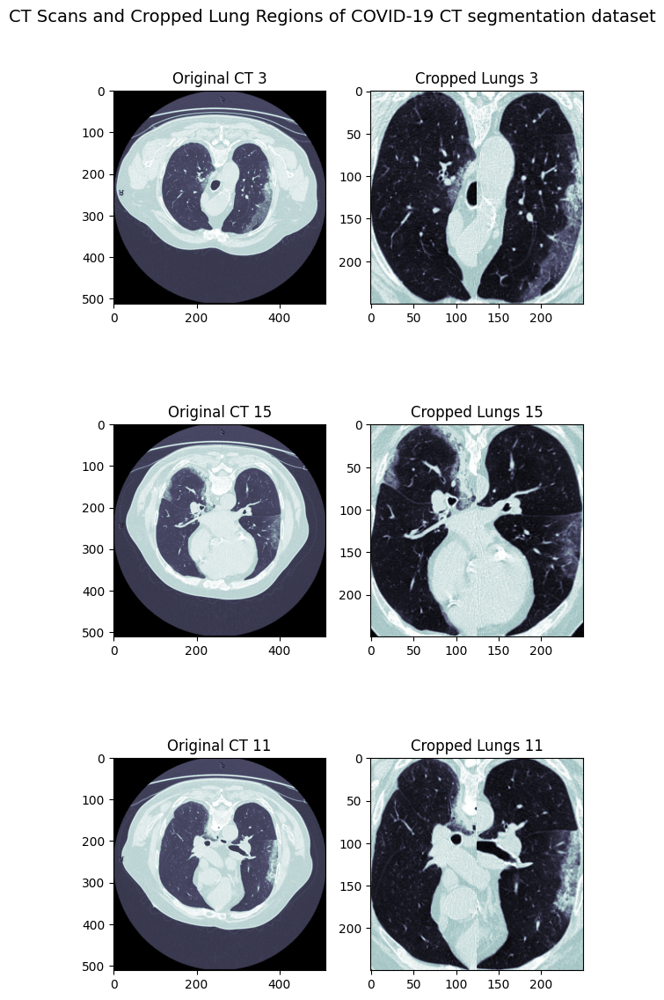

In [28]:
lung_mask_file = []
ct_scan_file = []

read_nii_demo("/kaggle/input/medseg-covid-dataset-2/rp_lung_msk/rp_lung_msk/1.nii", lung_mask_file)
read_nii_demo("/kaggle/input/medseg-covid-dataset-2/rp_im/rp_im/1.nii", ct_scan_file)

indices = random.sample(range(len(ct_scan_file)), 3)

fig, axes = plt.subplots(3, 2, figsize=(6, 12))
fig.suptitle("CT Scans and Cropped Lung Regions of COVID-19 CT segmentation dataset", fontsize=14)
for i, idx in enumerate(indices):
    lung_mask = lung_mask_file[idx]
    ct_scan = ct_scan_file[idx]

    lung_mask[lung_mask > 0] = 1
    _, lung1_points, lung2_points = cropper(lung_mask, demo=0)

    a,b,c,d = lung1_points
    e,f,g,h = lung2_points

    img1 = ct_scan[b:b+d, a:a+c]
    img1 = cv2.resize(img1, dsize=(125,250), interpolation=cv2.INTER_AREA)
    img2 = ct_scan[f:f+h, e:e+g]
    img2 = cv2.resize(img2, dsize=(125,250), interpolation=cv2.INTER_AREA)
    cropped = np.concatenate((img1, img2), axis=1)  

    axes[i,0].imshow(ct_scan, cmap='bone')
    axes[i,0].set_title(f"Original CT {idx}")

    axes[i,1].imshow(cropped, cmap='bone')
    axes[i,1].set_title(f"Cropped Lungs {idx}")

plt.tight_layout()
plt.show()


In [29]:
y_label_2 = []
for i in range(0, len(infections_2)):
  if len(np.unique(infections_2[i]))!=1:
    y_label_2.append(1)
  else:
    y_label_2.append(0)

In [30]:
print(f"Non-Covid-19 cases from dataset2: {y_label_2.count(0)}")
print(f"Covid-19 cases from dataset2: {y_label_2.count(1)}")

Non-Covid-19 cases from dataset2: 194
Covid-19 cases from dataset2: 303


In [31]:
print(len(cts_2) , len(infections_2))

497 497


In [32]:
cts = cts_1 + cts_2
lungs = lungs_1 + lungs_2
infections = infections_1 + infections_2

In [33]:
y_label = y_label_1 + y_label_2

In [34]:
dim1 = []
dim2 = []

for i in range(0, len(cts)):
    dim1.append(cts[i].shape[0])
    dim2.append(cts[i].shape[1])

dim1 = np.array(dim1)
dim2 = np.array(dim2)

In [35]:
np.unique(dim2)

array([250])

In [36]:
new_dim = 224

In [37]:
for i in range(0,len(cts)):
  cts[i] = cv2.resize(cts[i], dsize=(new_dim, new_dim), interpolation=cv2.INTER_LINEAR)

In [38]:
cts = np.array(cts)
cts = cts.reshape(len(cts), new_dim,new_dim,1)
y_label = np.array(y_label)
print(cts.shape, y_label.shape)

(2609, 224, 224, 1) (2609,)


In [39]:
np.save("cts.npy", cts)
np.save("y_label.npy", y_label)

# Data Augmentation

In [40]:
gc.collect()
cts = np.load("/kaggle/working/cts.npy", mmap_mode='r')
y_label = np.load("/kaggle/working/y_label.npy", mmap_mode='r')

In [41]:
from scipy.ndimage import rotate, zoom, shift
from skimage import exposure
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve, auc
import tensorflow as tf
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Conv2D, BatchNormalization, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint
from sklearn.utils.class_weight import compute_class_weight
import seaborn as sns
from tensorflow.keras import backend as K
from tensorflow.keras.layers import GlobalAveragePooling2D
from tensorflow.keras.applications import EfficientNetB0, EfficientNetB1, ResNet50, ResNet101, ConvNeXtTiny, ConvNeXtSmall, ConvNeXtBase
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping

2025-09-16 11:41:29.843668: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1758022890.048975      36 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1758022890.106749      36 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [42]:
covid_indices = np.where(y_label == 1)[0]
non_covid_indices = np.where(y_label == 0)[0]

x_covid = cts[covid_indices]
x_non_covid = cts[non_covid_indices]

print(f"Original COVID cases: {len(x_covid)}")
print(f"Original Non-COVID cases: {len(x_non_covid)}")

Original COVID cases: 1724
Original Non-COVID cases: 885


In [43]:
augmented_covid = []
augmented_non_covid = []

In [44]:
from scipy.ndimage import rotate, shift
from skimage import exposure
import numpy as np
import cv2

def medical_image_augmentation(x_data, y_data, target_samples_per_class=None):
    """
    Simple medical image augmentation for balancing classes
    """
    global augmented_covid, augmented_non_covid
    # Separate classes
    covid_indices = np.where(y_data == 1)[0]
    non_covid_indices = np.where(y_data == 0)[0]
    
    x_covid = x_data[covid_indices]
    x_non_covid = x_data[non_covid_indices]
    
    print(f"Original COVID cases: {len(x_covid)}")
    print(f"Original Non-COVID cases: {len(x_non_covid)}")
    
    # Set target samples per class
    if target_samples_per_class is None:
        target_samples_per_class = max(len(x_covid), len(x_non_covid))
    
    print(f"Target samples per class: {target_samples_per_class}")
    
    # Augment COVID class if needed
    augmented_covid = list(x_covid)
    covid_needed = target_samples_per_class - len(x_covid)
    
    if covid_needed > 0:
        for i in range(covid_needed):
            # Randomly select an image to augment
            idx = np.random.randint(0, len(x_covid))
            original_img = x_covid[idx].squeeze()
            
            # Apply random transformations
            angle = np.random.uniform(-10, 10)
            augmented = rotate(original_img, angle, reshape=False, mode='constant', cval=0.0)
            
            # Use shift with black padding instead of np.roll
            shift_x = np.random.uniform(-20, 20)
            shift_y = np.random.uniform(-20, 20)
            augmented = shift(augmented, shift=[shift_x, shift_y], mode='constant', cval=0.0)
            
            # Add random horizontal flip
            if np.random.random() > 0.5:
                augmented = np.fliplr(augmented)
            
            # Add random vertical flip (sometimes useful for CT)
            if np.random.random() > 0.7:
                augmented = np.flipud(augmented)
            
            # Ensure values are non-negative before gamma correction
            if np.random.random() > 0.5:
                # Rescale to ensure non-negative values
                augmented = exposure.rescale_intensity(augmented, out_range=(0, 1))
                augmented = exposure.adjust_gamma(augmented, gamma=np.random.uniform(0.8, 1.2))
            
            # Add slight noise
            if np.random.random() > 0.5:
                noise = np.random.normal(0, 0.01, augmented.shape)
                augmented = augmented + noise
            
            # Ensure final values are in valid range [0, 1]
            augmented = np.clip(augmented, 0, 1)
            
            # Ensure correct dimensions before reshaping
            if augmented.shape != (new_dim, new_dim):
                augmented = cv2.resize(augmented, (new_dim, new_dim), interpolation=cv2.INTER_LINEAR)
            
            augmented_covid.append(augmented.reshape(new_dim, new_dim, 1))
    
    # Augment Non-COVID class if needed
    augmented_non_covid = list(x_non_covid)
    non_covid_needed = target_samples_per_class - len(x_non_covid)
    
    if non_covid_needed > 0:
        for i in range(non_covid_needed):
            # Randomly select an image to augment
            idx = np.random.randint(0, len(x_non_covid))
            original_img = x_non_covid[idx].squeeze()
            
            # Apply random transformations
            angle = np.random.uniform(-10, 10)
            augmented = rotate(original_img, angle, reshape=False, mode='constant', cval=0.0)
            
            # Use shift with black padding instead of np.roll
            shift_x = np.random.uniform(-20, 20)
            shift_y = np.random.uniform(-20, 20)
            augmented = shift(augmented, shift=[shift_x, shift_y], mode='constant', cval=0.0)
            
            # Add random horizontal flip
            if np.random.random() > 0.5:
                augmented = np.fliplr(augmented)
            
            # Add random vertical flip
            if np.random.random() > 0.7:
                augmented = np.flipud(augmented)
            
            # Ensure values are non-negative before gamma correction
            if np.random.random() > 0.5:
                # Rescale to ensure non-negative values
                augmented = exposure.rescale_intensity(augmented, out_range=(0, 1))
                augmented = exposure.adjust_gamma(augmented, gamma=np.random.uniform(0.8, 1.2))
            
            # Add slight noise
            if np.random.random() > 0.5:
                noise = np.random.normal(0, 0.01, augmented.shape)
                augmented = augmented + noise
            
            # Ensure final values are in valid range [0, 1]
            augmented = np.clip(augmented, 0, 1)
            
            # Ensure correct dimensions before reshaping
            if augmented.shape != (new_dim, new_dim):
                augmented = cv2.resize(augmented, (new_dim, new_dim), interpolation=cv2.INTER_LINEAR)
            
            augmented_non_covid.append(augmented.reshape(new_dim, new_dim, 1))
    
    # Convert to numpy arrays and combine
    x_covid_final = np.array(augmented_covid[:target_samples_per_class])
    x_non_covid_final = np.array(augmented_non_covid[:target_samples_per_class])
    
    x_balanced = np.vstack([x_covid_final, x_non_covid_final])
    y_balanced = np.hstack([
        np.ones(len(x_covid_final)),
        np.zeros(len(x_non_covid_final))
    ])
    
    # Shuffle the dataset
    indices = np.random.permutation(len(x_balanced))
    x_balanced = x_balanced[indices]
    y_balanced = y_balanced[indices]
    
    print(f"Final COVID cases: {np.sum(y_balanced == 1)}")
    print(f"Final Non-COVID cases: {np.sum(y_balanced == 0)}")
    print(f"Total samples: {len(x_balanced)}")
    
    return x_balanced, y_balanced

In [45]:
cts = cts/255

In [46]:
x_train, x_valid, y_train, y_valid = train_test_split(
    cts, 
    y_label, 
    test_size=0.3, 
    random_state=42, 
    stratify=y_label
)

In [47]:
# Apply augmentation to balance classes
x_train, y_train= medical_image_augmentation(
    x_train, y_train, target_samples_per_class=2500
)

# Update class weights for balanced dataset
classes = np.unique(y_train)
weights_arr = compute_class_weight(class_weight="balanced", classes=classes, y=y_train)
class_weights = {int(c): float(w) for c, w in zip(classes, weights_arr)}
print("Updated class_weights:", class_weights)

Original COVID cases: 1207
Original Non-COVID cases: 619
Target samples per class: 2500
Final COVID cases: 2500
Final Non-COVID cases: 2500
Total samples: 5000
Updated class_weights: {0: 1.0, 1: 1.0}


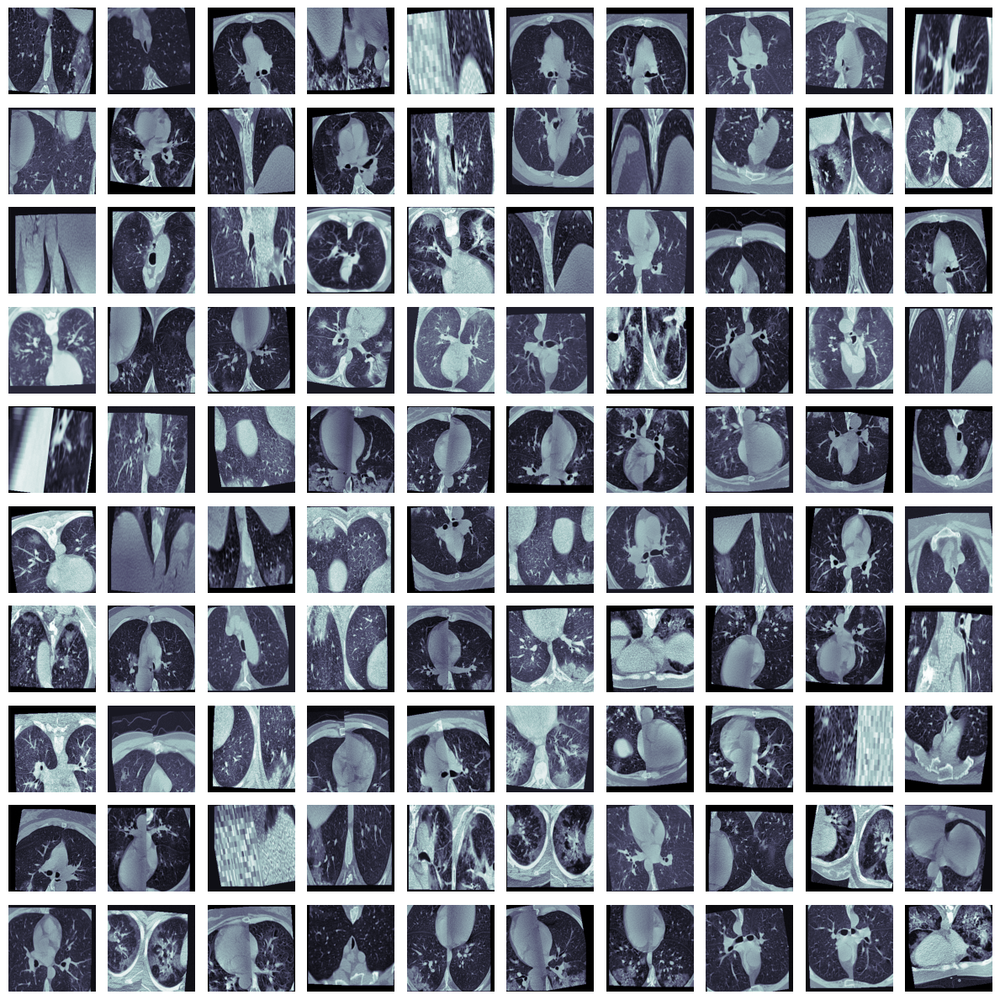

In [48]:
fig, axes = plt.subplots(10, 10, figsize=(12, 12))

# loop through the last 100 images (from -1 to -100)
for i, ax in enumerate(axes.flat):
    idx = -(i+1)   # -1, -2, ... -100
    ax.imshow(augmented_covid[idx], cmap="bone")
    ax.axis("off")

plt.tight_layout()
plt.show()

In [49]:
np.unique(y_label, return_counts=True)

(array([0, 1]), array([ 885, 1724]))

In [50]:
np.unique(y_train, return_counts=True)

(array([0., 1.]), array([2500, 2500]))

In [51]:
np.unique(y_valid, return_counts=True)

(array([0, 1]), array([266, 517]))

In [52]:
print(x_train.shape, x_valid.shape)
print(y_train.shape, y_valid.shape)

(5000, 224, 224, 1) (783, 224, 224, 1)
(5000,) (783,)


In [53]:
# Since your CT images are grayscale, convert them to 3-channel
def preprocess_for_transferlearning(x_train, x_valid):
    """Convert grayscale to RGB for EfficientNet"""
    # Convert from (N, H, W, 1) to (N, H, W, 3)
    x_train_rgb = np.repeat(x_train, 3, axis=-1)
    x_valid_rgb = np.repeat(x_valid, 3, axis=-1)
    
    # EfficientNet expects values in [0, 255] range
    x_train_rgb = x_train_rgb * 255.0
    x_valid_rgb = x_valid_rgb * 255.0
    
    return x_train_rgb, x_valid_rgb

In [54]:
x_train_rgb, x_valid_rgb = preprocess_for_transferlearning(x_train, x_valid)

In [55]:
os.makedirs("/kaggle/working/data", exist_ok=True)
np.save("/kaggle/working/data/x_train.npy", x_train)
np.save("/kaggle/working/data/y_train.npy", y_train)
np.save("/kaggle/working/data/x_valid.npy", x_valid)
np.save("/kaggle/working/data/y_valid.npy", y_valid)
np.save("/kaggle/working/data/x_train_rgb.npy", x_train_rgb)
np.save("/kaggle/working/data/x_valid_rgb.npy", x_valid_rgb)
gc.collect()

183805

# Training Phase

In [56]:
# Load preffered data

# RGB
x_train = np.load("/kaggle/working/data/x_train_rgb.npy", mmap_mode='r')
x_valid = np.load("/kaggle/working/data/x_valid_rgb.npy", mmap_mode='r')
y_train = np.load("/kaggle/working/data/y_train.npy", mmap_mode='r')
y_valid = np.load("/kaggle/working/data/y_valid.npy", mmap_mode='r')

# Single channel
# x_train = np.load("/kaggle/working/data/x_train.npy", mmap_mode='r')
# x_valid = np.load("/kaggle/working/data/x_valid.npy", mmap_mode='r')
# y_train = np.load("/kaggle/working/data/y_train.npy", mmap_mode='r')
# y_valid = np.load("/kaggle/working/data/y_valid.npy", mmap_mode='r')

In [57]:
class F1Score(tf.keras.metrics.Metric):
    def __init__(self, name="f1", threshold=0.5, **kwargs):
        super().__init__(name=name, **kwargs)
        self.threshold = threshold
        self.tp = self.add_weight(name="tp", initializer="zeros")
        self.fp = self.add_weight(name="fp", initializer="zeros")
        self.fn = self.add_weight(name="fn", initializer="zeros")

    def update_state(self, y_true, y_pred, sample_weight=None):
        y_true = tf.cast(y_true, tf.float32)
        y_pred = tf.cast(y_pred >= self.threshold, tf.float32)
        tp = tf.reduce_sum(y_true * y_pred)
        fp = tf.reduce_sum((1 - y_true) * y_pred)
        fn = tf.reduce_sum(y_true * (1 - y_pred))
        self.tp.assign_add(tp)
        self.fp.assign_add(fp)
        self.fn.assign_add(fn)

    def result(self):
        precision = self.tp / (self.tp + self.fp + tf.keras.backend.epsilon())
        recall = self.tp / (self.tp + self.fn + tf.keras.backend.epsilon())
        return 2.0 * precision * recall / (precision + recall + tf.keras.backend.epsilon())

    def reset_states(self):
        for v in (self.tp, self.fp, self.fn):
            v.assign(0.0)

In [58]:
# # Choose between B0 or B1 (B0 is lighter, B1 is slightly more accurate)
# def create_efficientnet_model(model_type='B1', input_shape=(224, 224, 3), num_classes=1):
#     """
#     Create EfficientNet model with transfer learning
    
#     Args:
#         model_type: 'B0' or 'B1'
#         input_shape: Input image shape
#         num_classes: Number of output classes (1 for binary classification)
#     """
    
#     # Load pre-trained EfficientNet
#     if model_type == 'B0':
#         base_model = EfficientNetB0(
#             weights='imagenet',
#             include_top=False,
#             input_shape=input_shape
#         )
#     else:  # B1
#         base_model = EfficientNetB1(
#             weights='imagenet',
#             include_top=False,
#             input_shape=input_shape
#         )
    
#     # Freeze base model initially for transfer learning
#     base_model.trainable = False
    
#     # Add custom classification head
#     inputs = base_model.input
#     x = base_model(inputs, training=False)
#     x = GlobalAveragePooling2D()(x)
#     x = Dropout(0.3)(x)
#     x = Dense(128, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
#     x = Dropout(0.5)(x)
#     outputs = Dense(num_classes, activation='sigmoid')(x)
    
#     model = Model(inputs, outputs)
#     return model, base_model

In [59]:
# def create_resnet_model(model_type='ResNet50', input_shape=(224, 224, 3), num_classes=1):
#     """
#     Create ResNet model with transfer learning
    
#     Args:
#         model_type: 'ResNet50' or 'ResNet101'
#         input_shape: Input image shape
#         num_classes: Number of output classes (1 for binary classification)
#     """
    
#     # Load pre-trained ResNet
#     if model_type == 'ResNet50':
#         base_model = ResNet50(
#             weights='imagenet',
#             include_top=False,
#             input_shape=input_shape
#         )
#     else:  # ResNet101
#         base_model = ResNet101(
#             weights='imagenet',
#             include_top=False,
#             input_shape=input_shape
#         )
    
#     # Freeze base model initially
#     base_model.trainable = False
    
#     # Add custom classification head
#     inputs = base_model.input
#     x = base_model(inputs, training=False)
#     x = GlobalAveragePooling2D()(x)
#     x = Dropout(0.3)(x)
#     x = Dense(128, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
#     x = Dropout(0.5)(x)
#     outputs = Dense(num_classes, activation='sigmoid')(x)  # sigmoid for binary
    
#     model = Model(inputs, outputs)
#     return model, base_model

In [60]:
# Create the model
# model, base_model = create_resnet_model('ResNet50', input_shape=(new_dim, new_dim, 3))

In [61]:
def create_convnext_model(model_type='Tiny', input_shape=(224, 224, 3), num_classes=1):
    """
    Create ConvNeXt model with transfer learning
    
    Args:
        model_type: 'Tiny', 'Small', or 'Base'
        input_shape: Input image shape
        num_classes: Number of output classes (1 for binary classification)
    """
    
    # Load pre-trained ConvNeXt
    if model_type == 'Tiny':
        base_model = ConvNeXtTiny(
            weights='imagenet',
            include_top=False,
            input_shape=input_shape
        )
    elif model_type == 'Small':
        base_model = ConvNeXtSmall(
            weights='imagenet',
            include_top=False,
            input_shape=input_shape
        )
    else:  # Base
        base_model = ConvNeXtBase(
            weights='imagenet',
            include_top=False,
            input_shape=input_shape
        )
    
    # Freeze base model initially for transfer learning
    base_model.trainable = False
    
    # Add custom classification head
    inputs = base_model.input
    x = base_model(inputs, training=False)
    x = GlobalAveragePooling2D()(x)
    x = Dropout(0.4)(x)
    x = Dense(256, activation='relu')(x)
    x = Dropout(0.3)(x)
    outputs = Dense(num_classes, activation='sigmoid')(x)
    model = Model(inputs, outputs)
    return model, base_model

In [62]:
# Create the ConvNeXt model (start with Tiny for faster training)
model, base_model = create_convnext_model('Tiny', input_shape=(new_dim, new_dim, 3))

I0000 00:00:1758022994.061557      36 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1758022994.062201      36 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


111650432/111650432 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [63]:
classes = np.unique(y_train)
weights_arr = compute_class_weight(class_weight="balanced", classes=classes, y=y_train)
class_weights = {int(c): float(w) for c, w in zip(classes, weights_arr)}
print("class_weights:", class_weights)

class_weights: {0: 1.0, 1: 1.0}


## Callbacks

In [64]:
ckpt_loss = ModelCheckpoint(
    "transfer_learning_loss.weights.h5", monitor="val_loss",
    save_best_only=True, mode="min", verbose=1, save_weights_only=True
)

In [65]:
ckpt_auc = ModelCheckpoint(
    "transfer_learning_auc.weights.h5", monitor="val_auc",
    save_best_only=True, mode="max", verbose=1, save_weights_only=True
)

In [66]:
reduce_lr = ReduceLROnPlateau(
    monitor='val_loss', 
    factor=0.2, 
    patience=3, 
    min_lr=1e-7,
    verbose=1
)

In [67]:
early_stop = EarlyStopping(
    monitor='val_loss',
    patience=7,
    restore_best_weights=True,
    verbose=1
)

## Losses

In [68]:
def weighted_binary_crossentropy(weights):
    def loss(y_true, y_pred):
        y_pred = tf.clip_by_value(y_pred, tf.keras.backend.epsilon(), 1 - tf.keras.backend.epsilon())
        bce = -(weights[1] * y_true * tf.math.log(y_pred) + 
                weights[0] * (1 - y_true) * tf.math.log(1 - y_pred))
        return tf.reduce_mean(bce)
    return loss

In [69]:
def binary_focal_loss(gamma=2., alpha=.25):
    def loss(y_true, y_pred):
        bce = tf.keras.losses.binary_crossentropy(y_true, y_pred, from_logits=False)
        y_pred = tf.clip_by_value(y_pred, tf.keras.backend.epsilon(), 1 - tf.keras.backend.epsilon())
        p_t = y_true * y_pred + (1 - y_true) * (1 - y_pred)
        alpha_factor = y_true * alpha + (1 - y_true) * (1 - alpha)
        modulating_factor = tf.pow((1 - p_t), gamma)
        return tf.reduce_mean(alpha_factor * modulating_factor * bce)
    return loss

In [70]:
class_weights

{0: 1.0, 1: 1.0}

In [71]:
# Compile model
model.compile(
    optimizer=Adam(learning_rate=1e-3),
    loss='binary_crossentropy',
    metrics=[
        tf.keras.metrics.Precision(name="precision"),
        tf.keras.metrics.Recall(name="recall"),
        F1Score(name="f1"),
        tf.keras.metrics.AUC(name="auc", curve="ROC")
    ]
)

print("Phase 1: Training with frozen ConvNeXt base model")
print(model.summary())

# Phase 1: Train with frozen base model
history_1 = model.fit(
    x_train, y_train,
    batch_size=32,
    epochs=20,
    validation_data=(x_valid, y_valid),
    callbacks=[reduce_lr, early_stop, ckpt_auc, ckpt_loss],
    class_weight=class_weights,
    verbose=1
)

print("\nPhase 2: Fine-tuning ConvNeXt with unfrozen layers")

# Phase 2: Fine-tuning
base_model.trainable = True

# Fine-tune from this layer onwards (keep early layers frozen)
fine_tune_at = len(base_model.layers) // 3  # Unfreeze more layers for ConvNeXt

# Freeze all the layers before fine_tune_at
for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

# Recompile with lower learning rate for fine-tuning
model.compile(
    optimizer=Adam(learning_rate=1e-5),  # Lower learning rate for fine-tuning
    loss='binary_crossentropy',
    metrics=[
        tf.keras.metrics.Precision(name="precision"),
        tf.keras.metrics.Recall(name="recall"),
        F1Score(name="f1"),
        tf.keras.metrics.AUC(name="auc", curve="ROC")
    ]
)

# Fine-tuning phase
history_2 = model.fit(
    x_train, y_train,
    batch_size=32,
    epochs=15,
    validation_data=(x_valid, y_valid),
    callbacks=[reduce_lr, early_stop, ckpt_auc, ckpt_loss],
    class_weight=class_weights,
    verbose=1
)

# Load best weights
model.load_weights('transfer_learning_loss.weights.h5')

Phase 1: Training with frozen ConvNeXt base model


Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny (Functional)      │ (None, 7, 7, 768)      │    27,820,128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 768)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 768)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │       196,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 28,017,249 (106.88 MB)

 Trainable params: 197,121 (770.00 KB)

 Non-trainable params: 27,820,128 (106.13 MB)

None
Epoch 1/20


I0000 00:00:1758023031.803281     105 service.cc:148] XLA service 0x789a5003c830 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1758023031.804658     105 service.cc:156]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1758023031.804679     105 service.cc:156]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1758023033.682496     105 cuda_dnn.cc:529] Loaded cuDNN version 90300
E0000 00:00:1758023036.184400     105 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1758023036.319416     105 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


  1/157 ━━━━━━━━━━━━━━━━━━━━ 1:01:23 24s/step - auc: 0.5391 - f1: 0.6098 - loss: 0.7407 - precision: 0.5200 - recall: 0.8125

I0000 00:00:1758023040.103658     105 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


156/157 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step - auc: 0.8332 - f1: 0.5085 - loss: 0.4920 - precision: 0.7593 - recall: 0.7453

E0000 00:00:1758023060.295892     106 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1758023060.430483     106 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step - auc: 0.8336 - f1: 0.5084 - loss: 0.4915 - precision: 0.7596 - recall: 0.7456

E0000 00:00:1758023074.638892     106 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1758023074.774147     106 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.



Epoch 1: val_auc improved from -inf to 0.95428, saving model to transfer_learning_auc.weights.h5

Epoch 1: val_loss improved from inf to 0.26037, saving model to transfer_learning_loss.weights.h5
157/157 ━━━━━━━━━━━━━━━━━━━━ 62s 245ms/step - auc: 0.8339 - f1: 0.5084 - loss: 0.4910 - precision: 0.7599 - recall: 0.7459 - val_auc: 0.9543 - val_f1: 0.6706 - val_loss: 0.2604 - val_precision: 0.9143 - val_recall: 0.9284 - learning_rate: 0.0010
Epoch 2/20
156/157 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - auc: 0.9310 - f1: 0.5013 - loss: 0.3329 - precision: 0.8635 - recall: 0.8384
Epoch 2: val_auc improved from 0.95428 to 0.96650, saving model to transfer_learning_auc.weights.h5

Epoch 2: val_loss improved from 0.26037 to 0.24210, saving model to transfer_learning_loss.weights.h5
157/157 ━━━━━━━━━━━━━━━━━━━━ 23s 148ms/step - auc: 0.9311 - f1: 0.5014 - loss: 0.3328 - precision: 0.8635 - recall: 0.8386 - val_auc: 0.9665 - val_f1: 0.6459 - val_loss: 0.2421 - val_precision: 0.9467 - val_recall: 0.8936

E0000 00:00:1758023638.927561     104 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1758023639.061389     104 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


156/157 ━━━━━━━━━━━━━━━━━━━━ 0s 613ms/step - auc: 0.9979 - f1: 0.5141 - loss: 0.0608 - precision: 0.9774 - recall: 0.9800

E0000 00:00:1758023750.984546     105 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1758023751.117312     105 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 702ms/step - auc: 0.9979 - f1: 0.5141 - loss: 0.0608 - precision: 0.9774 - recall: 0.9800
Epoch 1: val_auc improved from 0.99436 to 0.99489, saving model to transfer_learning_auc.weights.h5

Epoch 1: val_loss did not improve from 0.09253
157/157 ━━━━━━━━━━━━━━━━━━━━ 172s 791ms/step - auc: 0.9979 - f1: 0.5141 - loss: 0.0608 - precision: 0.9774 - recall: 0.9800 - val_auc: 0.9949 - val_f1: 0.6595 - val_loss: 0.0929 - val_precision: 0.9784 - val_recall: 0.9632 - learning_rate: 1.0000e-05
Epoch 2/15
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 612ms/step - auc: 0.9985 - f1: 0.5037 - loss: 0.0448 - precision: 0.9879 - recall: 0.9846
Epoch 2: val_auc improved from 0.99489 to 0.99567, saving model to transfer_learning_auc.weights.h5

Epoch 2: val_loss improved from 0.09253 to 0.08386, saving model to transfer_learning_loss.weights.h5
157/157 ━━━━━━━━━━━━━━━━━━━━ 102s 650ms/step - auc: 0.9986 - f1: 0.5037 - loss: 0.0447 - precision: 0.9879 - recall: 0.9846 - val_auc: 0.9957 -

In [72]:
score = model.evaluate(x_valid, y_valid, batch_size=32)
print("test loss:" , score[0], "\ntest f1 score:" , score[1])

25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 142ms/step - auc: 0.9972 - f1: 0.6451 - loss: 0.0664 - precision: 0.9797 - recall: 0.9711
test loss: 0.0814180076122284 
test f1 score: 0.9766536951065063


In [73]:
y_pred_prob = model.predict(x_valid, batch_size=32)
y_pred = (y_pred_prob > 0.5).astype(int) 

25/25 ━━━━━━━━━━━━━━━━━━━━ 11s 295ms/step


In [74]:
print("Classification Report:")
print(classification_report(y_valid, y_pred, digits=4))

Classification Report:
              precision    recall  f1-score   support

           0     0.9442    0.9549    0.9495       266
           1     0.9767    0.9710    0.9738       517

    accuracy                         0.9655       783
   macro avg     0.9604    0.9629    0.9617       783
weighted avg     0.9656    0.9655    0.9656       783



In [75]:
print("Confusion Matrix:")
print(confusion_matrix(y_valid, y_pred))

Confusion Matrix:
[[254  12]
 [ 15 502]]


In [76]:
auc_score = roc_auc_score(y_valid, y_pred_prob)
print(f"ROC-AUC: {auc_score:.4f}")

ROC-AUC: 0.9962


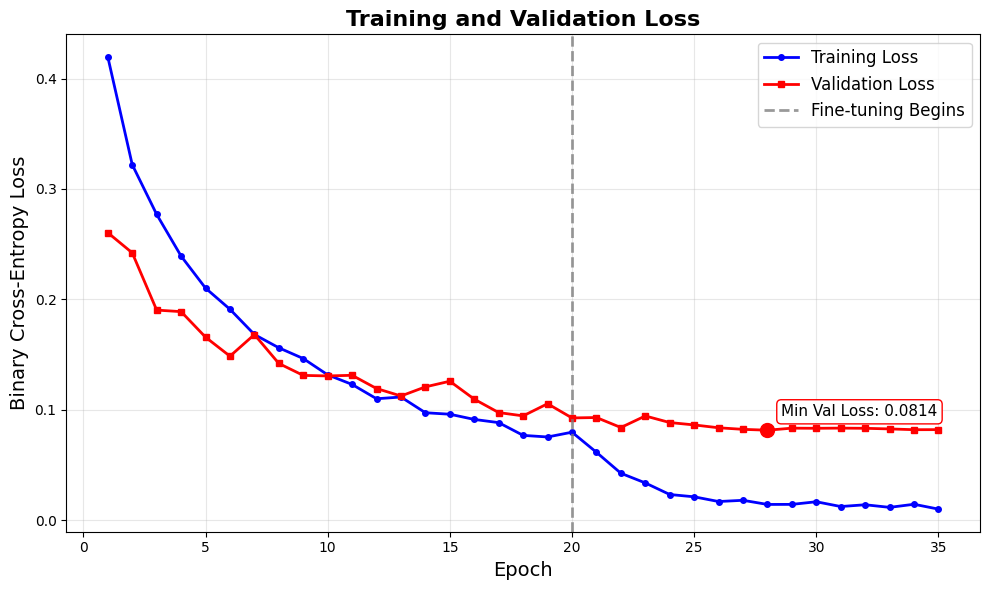

In [78]:
def plot_training_loss(history_1, history_2):
    """
    Plot training and validation loss for two-phase training
    """
    # Combine histories
    combined_loss = history_1.history['loss'] + history_2.history['loss']
    combined_val_loss = history_1.history['val_loss'] + history_2.history['val_loss']
    
    phase1_epochs = len(history_1.history['loss'])
    total_epochs = len(combined_loss)
    epochs = range(1, total_epochs + 1)
    
    plt.figure(figsize=(10, 6))
    plt.plot(epochs, combined_loss, 'b-', linewidth=2, label='Training Loss', marker='o', markersize=4)
    plt.plot(epochs, combined_val_loss, 'r-', linewidth=2, label='Validation Loss', marker='s', markersize=4)
    
    # Add phase separator
    plt.axvline(x=phase1_epochs, color='gray', linestyle='--', linewidth=2, alpha=0.8, label='Fine-tuning Begins')
    
    # Highlight minimum validation loss
    min_val_loss_idx = np.argmin(combined_val_loss)
    min_val_loss = combined_val_loss[min_val_loss_idx]
    plt.scatter(min_val_loss_idx+1, min_val_loss, color='red', s=100, zorder=5)
    plt.annotate(f'Min Val Loss: {min_val_loss:.4f}', 
                xy=(min_val_loss_idx+1, min_val_loss), 
                xytext=(10, 10), textcoords='offset points', fontsize=11,
                bbox=dict(boxstyle='round,pad=0.3', facecolor='white', edgecolor='red'))
    
    plt.title('Training and Validation Loss', fontsize=16, fontweight='bold')
    plt.xlabel('Epoch', fontsize=14)
    plt.ylabel('Binary Cross-Entropy Loss', fontsize=14)
    plt.legend(fontsize=12)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.savefig('training_loss.png', dpi=300, bbox_inches='tight')
    plt.show()

plot_training_loss(history_1, history_2)

In [79]:
predictions = model.predict(x_valid).flatten()

25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 139ms/step


In [80]:
fpr, tpr, thresholds = roc_curve(y_valid, predictions)
roc_auc = auc(fpr, tpr)

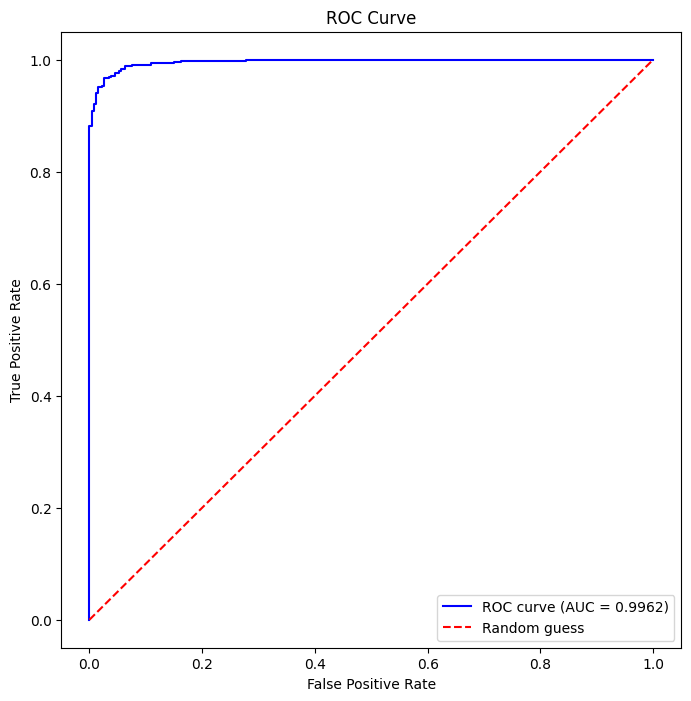

ROC-AUC: 0.9962260583761143


In [81]:
plt.figure(figsize=(8,8))
plt.plot(fpr, tpr, color='blue', label=f'ROC curve (AUC = {roc_auc:.4f})')
plt.plot([0,1], [0,1], color='red', linestyle='--', label="Random guess")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend(loc="lower right")
plt.show()

print("ROC-AUC:", roc_auc)

In [82]:
predictions = model.predict(x_valid).flatten()

# convert to binary labels using threshold 0.5
y_pred = (predictions >= 0.5).astype(int)

25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 142ms/step


In [84]:
types = []
for true, pred in zip(y_valid, y_pred):
    if true == 1 and pred == 1:
        types.append("TP")
    elif true == 0 and pred == 0:
        types.append("TN")
    elif true == 1 and pred == 0:
        types.append("FN")
    elif true == 0 and pred == 1:
        types.append("FP")

In [85]:
df = pd.DataFrame({
    "class": y_valid,
    "pred": predictions,
    "type": types
})

def plot_violin_dist(threshold):
    plt.figure(figsize=(8,6))
    sns.violinplot(x="class", y="pred", data=df, inner=None, color="0.8")
    sns.stripplot(x="class", y="pred", data=df, hue="type", 
                  palette={"TP":"red","TN":"green","FP":"black","FN":"purple"},
                  size=6, jitter=True, dodge=False)
    
    plt.axhline(y=threshold, color="red", linestyle="--", label=f"threshold = {threshold}")
    plt.title(f"Threshold at {threshold}")
    plt.ylabel("Predicted probability")
    plt.xlabel("True class")
    plt.legend(loc="upper left")
    plt.show()

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


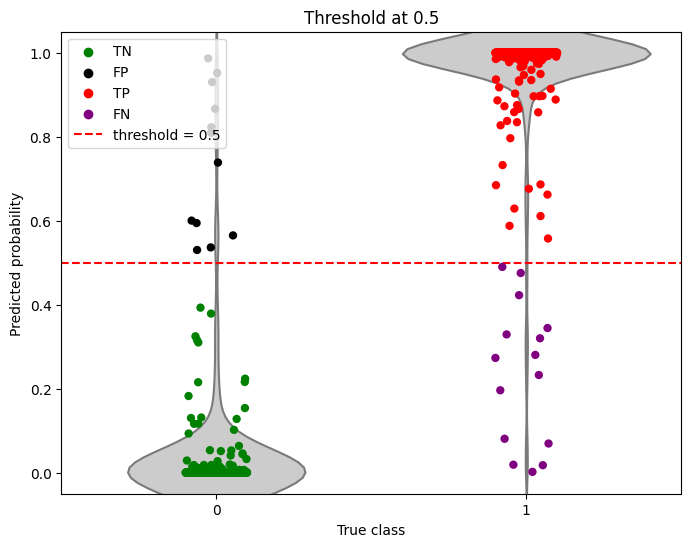

In [86]:
plot_violin_dist(0.5)

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


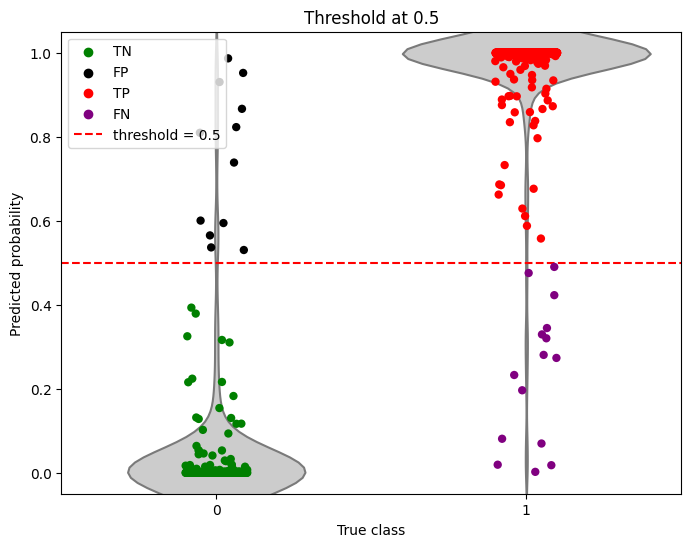

In [87]:
plot_violin_dist(0.5)

In [88]:
new_predictions = model.predict(x_valid).flatten()

new_pred = (new_predictions >= 0.5).astype(int)

25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 143ms/step


In [89]:
fpr, tpr, thresholds = roc_curve(y_valid, new_pred)
roc_auc = auc(fpr, tpr)

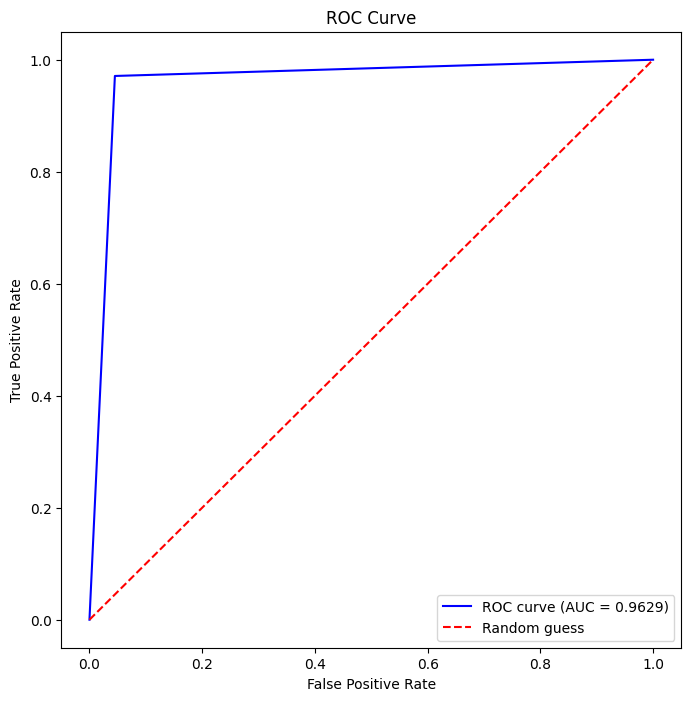

ROC-AUC: 0.9629368391966378


In [90]:
plt.figure(figsize=(8,8))
plt.plot(fpr, tpr, color='blue', label=f'ROC curve (AUC = {roc_auc:.4f})')
plt.plot([0,1], [0,1], color='red', linestyle='--', label="Random guess")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend(loc="lower right")
plt.show()

print("ROC-AUC:", roc_auc)

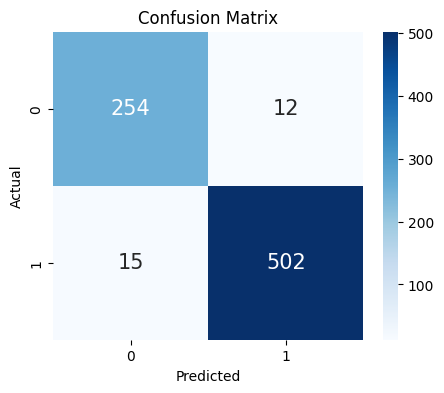

In [91]:
cm = confusion_matrix(y_valid, new_pred)
plt.figure(figsize=(5,4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', annot_kws={"size": 15})
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

In [92]:
print("Classification Report:")
print(classification_report(y_valid, new_pred, digits=4))

Classification Report:
              precision    recall  f1-score   support

           0     0.9442    0.9549    0.9495       266
           1     0.9767    0.9710    0.9738       517

    accuracy                         0.9655       783
   macro avg     0.9604    0.9629    0.9617       783
weighted avg     0.9656    0.9655    0.9656       783

